## Imports

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
import sys
import os
sys.path.append(os.path.abspath('../modules'))
from best_pipelines import models_to_cv
from preproc import PhishingDatasetPreproc
from xai import CompleteXAI

## Setup

In [2]:
np.random.seed(42)

In [3]:
prep = PhishingDatasetPreproc()
dataset, X, y = prep.basic_operations()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25)

In [4]:
categorical_features = list(X_train.columns)
categorical_features

['having_IP_Address',
 'URL_Length',
 'Shortining_Service',
 'having_At_Symbol',
 'double_slash_redirecting',
 'Prefix_Suffix',
 'having_Sub_Domain',
 'SSLfinal_State',
 'Domain_registeration_length',
 'Favicon',
 'port',
 'HTTPS_token',
 'Request_URL',
 'URL_of_Anchor',
 'Links_in_tags',
 'SFH',
 'Submitting_to_email',
 'Abnormal_URL',
 'Redirect',
 'on_mouseover',
 'RightClick',
 'popUpWidnow',
 'Iframe',
 'age_of_domain',
 'DNSRecord',
 'web_traffic',
 'Page_Rank',
 'Google_Index',
 'Links_pointing_to_page',
 'Statistical_report']

In [5]:
best_pipelines, ensembles = models_to_cv()

In [6]:
lgbm = best_pipelines['LGBM']
dtr = best_pipelines['DTR']
xgb = best_pipelines['XGB']

## Decision Tree

In [7]:
dtr.fit(X_train,y_train)

Pipeline(steps=[('selector',
                 SelectFromModel(estimator=RandomForestClassifier(n_estimators=112))),
                ('model',
                 DecisionTreeClassifier(criterion='entropy', max_depth=11,
                                        max_features='log2', min_samples_leaf=2,
                                        min_samples_split=4,
                                        splitter='random'))])

In [8]:
dtr[1]

DecisionTreeClassifier(criterion='entropy', max_depth=11, max_features='log2',
                       min_samples_leaf=2, min_samples_split=4,
                       splitter='random')

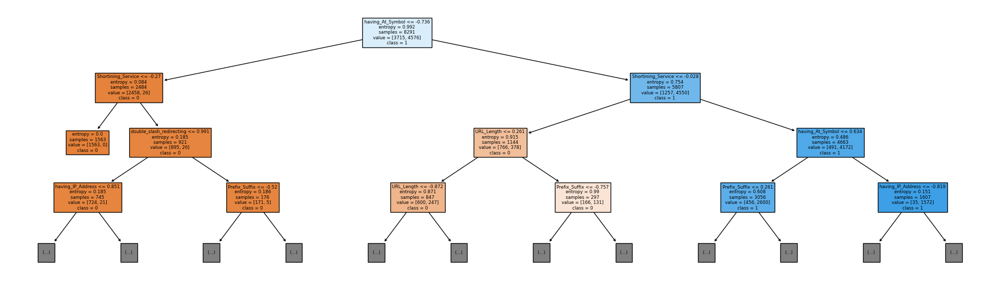

In [16]:
from sklearn import tree

fig = plt.figure(figsize=(25,7))
fig = tree.plot_tree(dtr[1], feature_names = list(X_train.columns), class_names=['0', '1'],max_depth=3, filled=True)
plt.savefig('../outputs/dtr_vis.png')
plt.show()

## LightGBM

In [110]:
lgbm.fit(X_train,y_train)

[LightGBM] [Info] Number of positive: 4576, number of negative: 3715
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000640 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 89
[LightGBM] [Info] Number of data points in the train set: 8291, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.551924 -> initscore=0.208447
[LightGBM] [Info] Start training from score 0.208447


Pipeline(steps=[('selector',
                 SelectKBest(k=30,
                             score_func=<function mutual_info_classif at 0x000001A8EFCA3A60>)),
                ('model',
                 LGBMClassifier(learning_rate=0.098, max_depth=8,
                                n_estimators=193, num_leaves=58,
                                subsample=0.87))])

In [116]:
xai = CompleteXAI(X_train, y_train, X_test, y_test, categorical_features, lgbm[1])

PermutationExplainer explainer: 2765it [02:36, 16.20it/s]                          


Barplot para classe 1


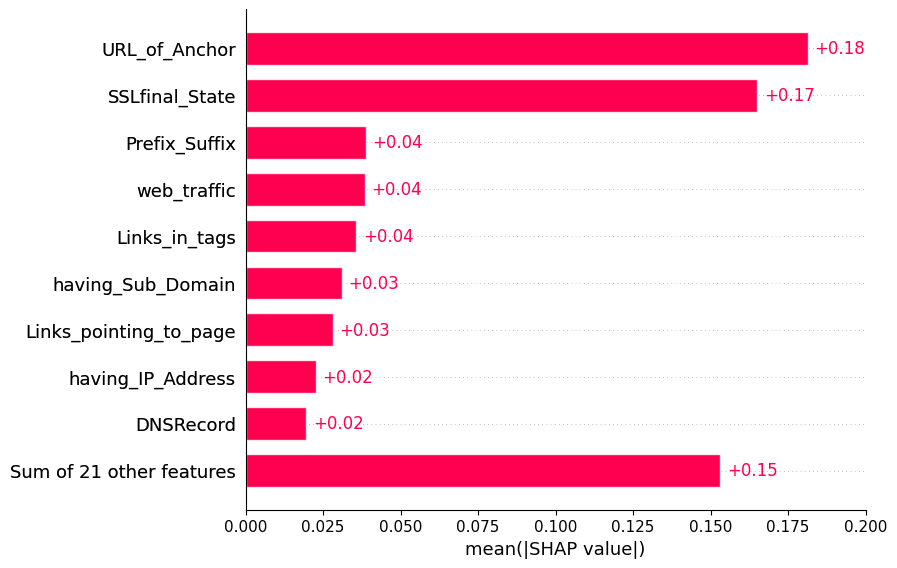

Violin plot para classe 1


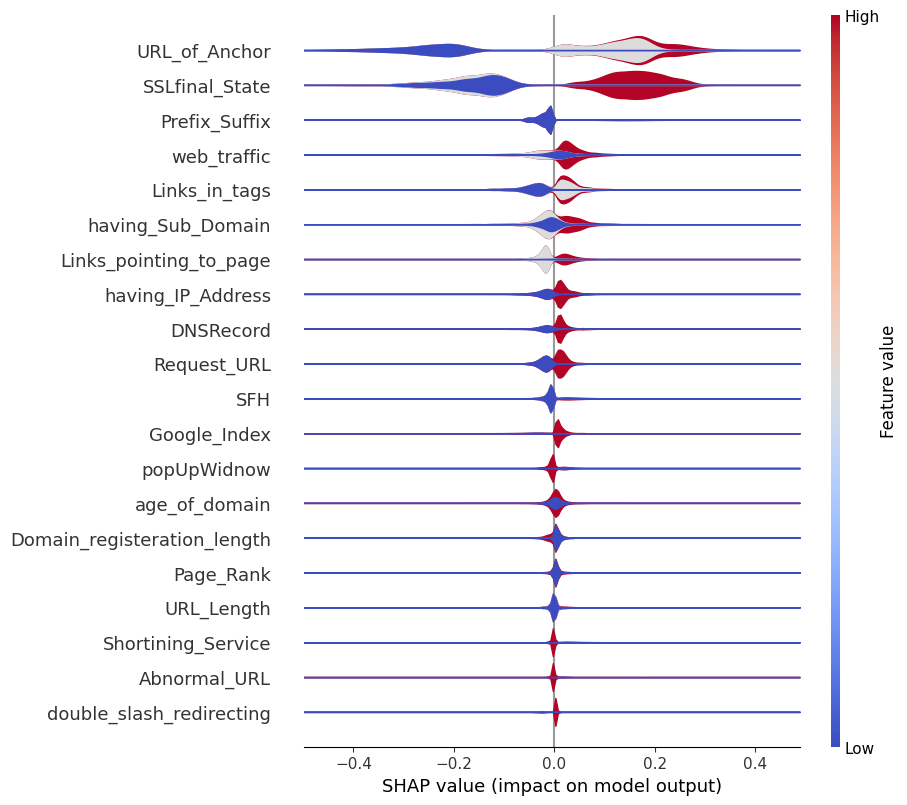

In [117]:
xai.run_global_shap()

PermutationExplainer explainer: 2765it [04:19, 10.21it/s]                          


Instância 2552

Variáveis:
 having_IP_Address              1
URL_Length                    -1
Shortining_Service             1
having_At_Symbol               1
double_slash_redirecting       1
Prefix_Suffix                 -1
having_Sub_Domain             -1
SSLfinal_State                -1
Domain_registeration_length    1
Favicon                        1
port                           1
HTTPS_token                    1
Request_URL                   -1
URL_of_Anchor                  0
Links_in_tags                  0
SFH                           -1
Submitting_to_email            1
Abnormal_URL                   1
Redirect                       0
on_mouseover                   1
RightClick                     1
popUpWidnow                    1
Iframe                         1
age_of_domain                 -1
DNSRecord                      1
web_traffic                    1
Page_Rank                     -1
Google_Index                   1
Links_pointing_to_page         0
Statistical_rep

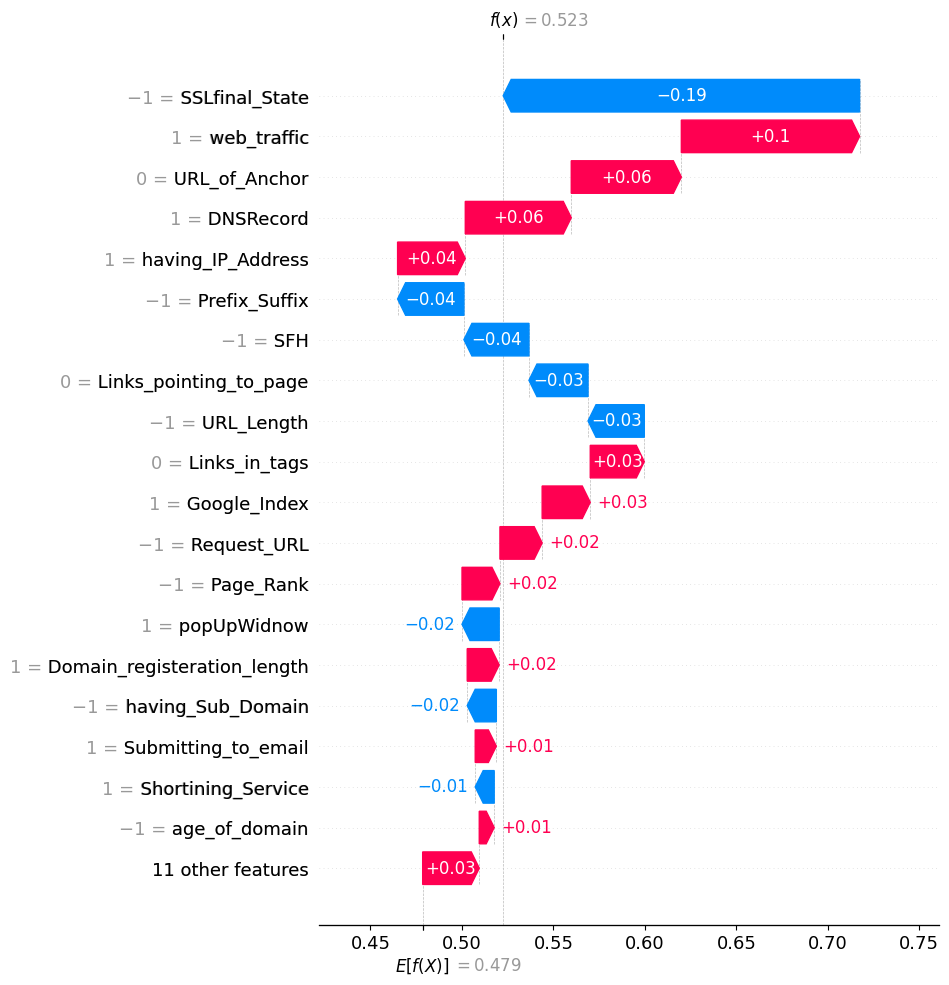

Instância 2743

Variáveis:
 having_IP_Address              1
URL_Length                    -1
Shortining_Service             1
having_At_Symbol               1
double_slash_redirecting       1
Prefix_Suffix                 -1
having_Sub_Domain              0
SSLfinal_State                -1
Domain_registeration_length   -1
Favicon                        1
port                           1
HTTPS_token                    1
Request_URL                   -1
URL_of_Anchor                  0
Links_in_tags                 -1
SFH                            1
Submitting_to_email            1
Abnormal_URL                   1
Redirect                       0
on_mouseover                   1
RightClick                     1
popUpWidnow                    1
Iframe                         1
age_of_domain                 -1
DNSRecord                      1
web_traffic                   -1
Page_Rank                     -1
Google_Index                   1
Links_pointing_to_page         0
Statistical_rep

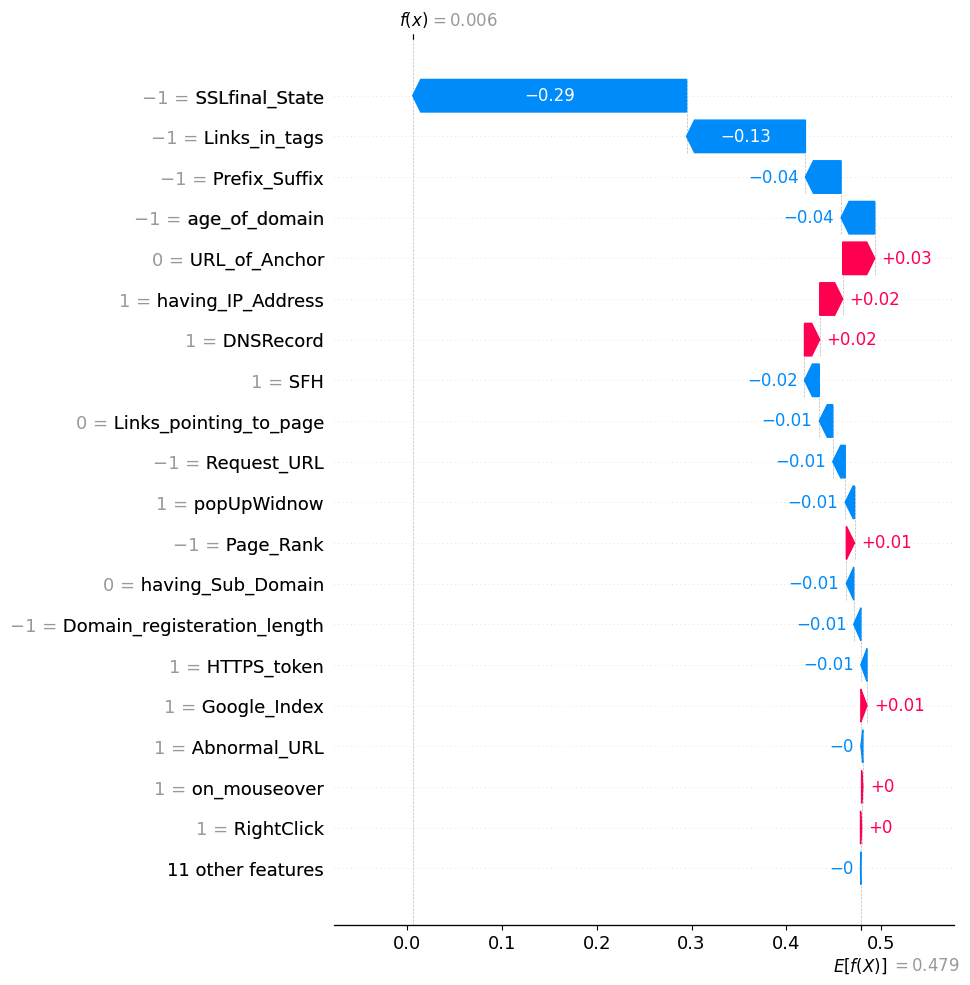

Instância 928

Variáveis:
 having_IP_Address              1
URL_Length                    -1
Shortining_Service             1
having_At_Symbol               1
double_slash_redirecting       1
Prefix_Suffix                 -1
having_Sub_Domain              0
SSLfinal_State                -1
Domain_registeration_length   -1
Favicon                        1
port                           1
HTTPS_token                    1
Request_URL                    1
URL_of_Anchor                  0
Links_in_tags                 -1
SFH                           -1
Submitting_to_email            1
Abnormal_URL                   1
Redirect                       0
on_mouseover                   1
RightClick                     1
popUpWidnow                    1
Iframe                         1
age_of_domain                 -1
DNSRecord                      1
web_traffic                    1
Page_Rank                     -1
Google_Index                   1
Links_pointing_to_page         0
Statistical_repo

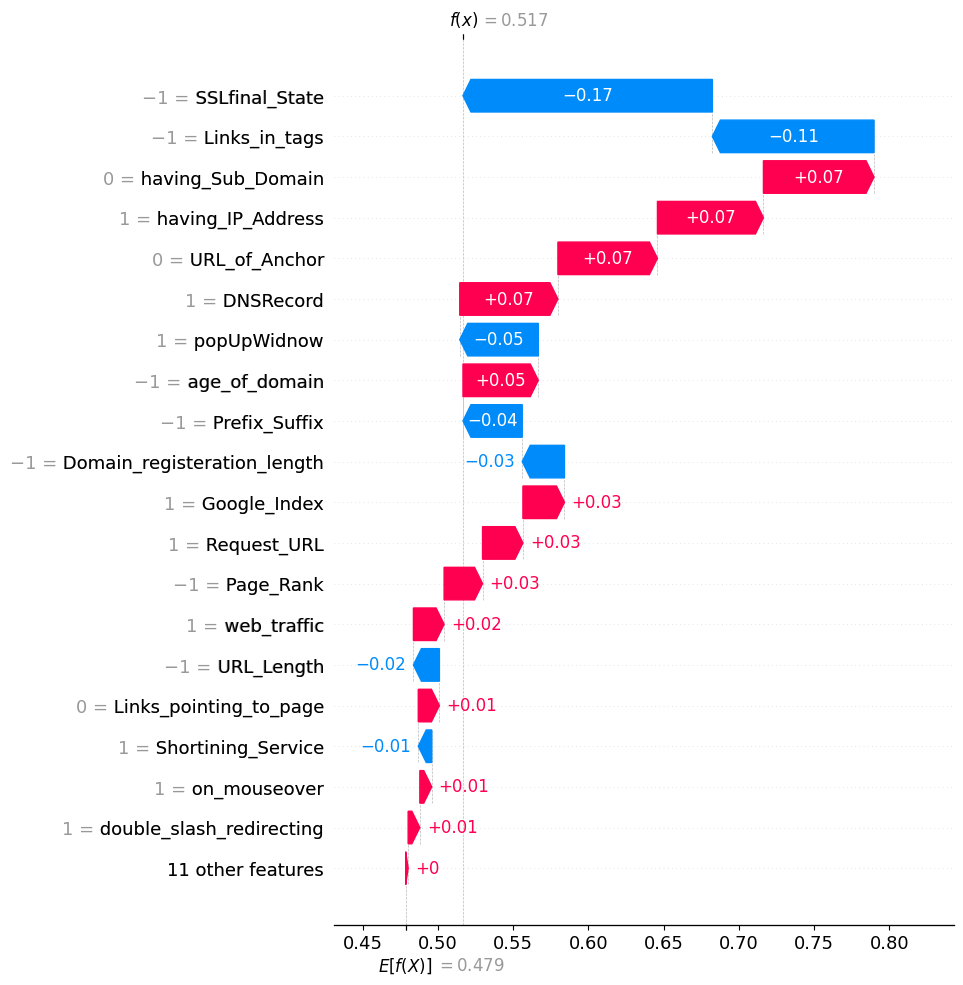

Instância 237

Variáveis:
 having_IP_Address              1
URL_Length                    -1
Shortining_Service             1
having_At_Symbol               1
double_slash_redirecting       1
Prefix_Suffix                 -1
having_Sub_Domain              1
SSLfinal_State                 1
Domain_registeration_length   -1
Favicon                        1
port                           1
HTTPS_token                    1
Request_URL                    1
URL_of_Anchor                  0
Links_in_tags                  1
SFH                           -1
Submitting_to_email            1
Abnormal_URL                   1
Redirect                       1
on_mouseover                   1
RightClick                     1
popUpWidnow                    1
Iframe                         1
age_of_domain                 -1
DNSRecord                      1
web_traffic                    0
Page_Rank                      1
Google_Index                   1
Links_pointing_to_page         0
Statistical_repo

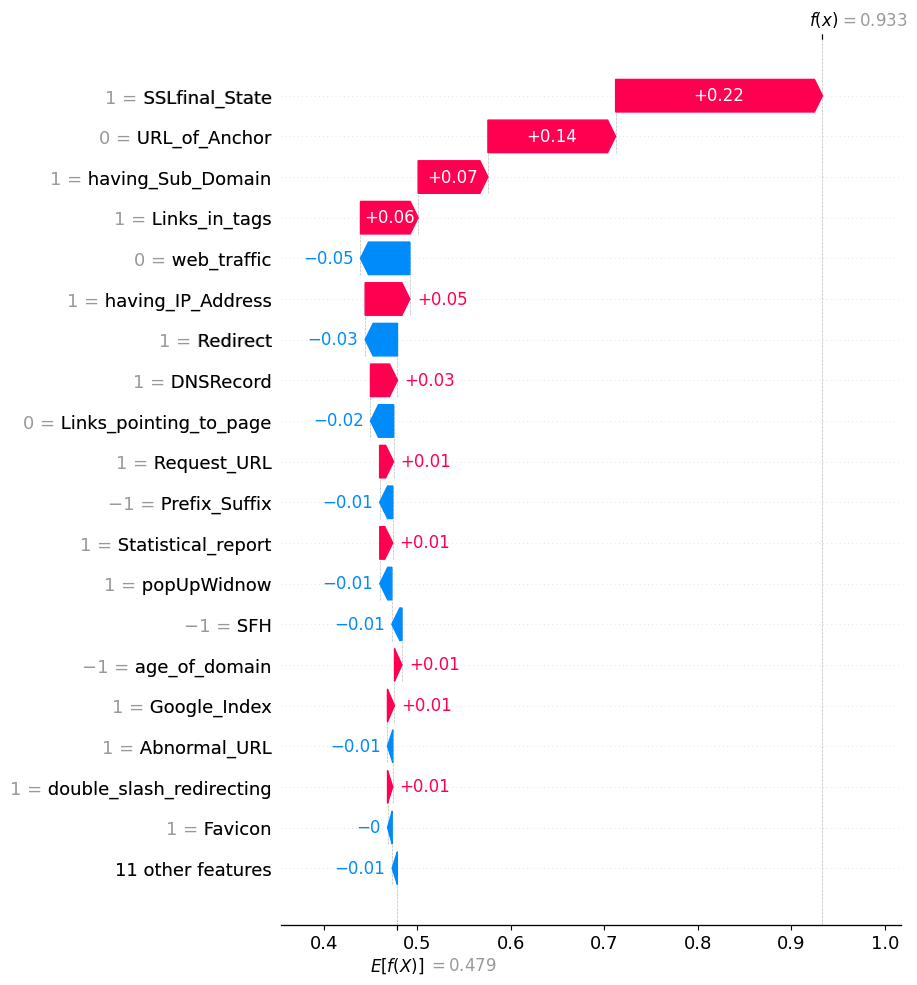

In [118]:
xai.run_local_shap()

Instância 1423

Variáveis:
 having_IP_Address              1
URL_Length                    -1
Shortining_Service             1
having_At_Symbol               1
double_slash_redirecting       1
Prefix_Suffix                 -1
having_Sub_Domain              1
SSLfinal_State                 1
Domain_registeration_length   -1
Favicon                        1
port                           1
HTTPS_token                    1
Request_URL                    1
URL_of_Anchor                  0
Links_in_tags                 -1
SFH                           -1
Submitting_to_email            1
Abnormal_URL                   1
Redirect                       0
on_mouseover                   1
RightClick                     1
popUpWidnow                    1
Iframe                         1
age_of_domain                  1
DNSRecord                      1
web_traffic                    0
Page_Rank                     -1
Google_Index                   1
Links_pointing_to_page         0
Statistical_rep

Instância 2056

Variáveis:
 having_IP_Address              1
URL_Length                    -1
Shortining_Service             1
having_At_Symbol               1
double_slash_redirecting       1
Prefix_Suffix                 -1
having_Sub_Domain              0
SSLfinal_State                 1
Domain_registeration_length   -1
Favicon                       -1
port                          -1
HTTPS_token                    1
Request_URL                    1
URL_of_Anchor                  0
Links_in_tags                 -1
SFH                           -1
Submitting_to_email           -1
Abnormal_URL                   1
Redirect                       0
on_mouseover                  -1
RightClick                     1
popUpWidnow                   -1
Iframe                        -1
age_of_domain                 -1
DNSRecord                     -1
web_traffic                    1
Page_Rank                      1
Google_Index                   1
Links_pointing_to_page         1
Statistical_rep

Instância 2755

Variáveis:
 having_IP_Address             -1
URL_Length                    -1
Shortining_Service             1
having_At_Symbol               1
double_slash_redirecting       1
Prefix_Suffix                 -1
having_Sub_Domain              0
SSLfinal_State                -1
Domain_registeration_length    1
Favicon                        1
port                           1
HTTPS_token                    1
Request_URL                   -1
URL_of_Anchor                  0
Links_in_tags                 -1
SFH                           -1
Submitting_to_email            1
Abnormal_URL                   1
Redirect                       0
on_mouseover                   1
RightClick                     1
popUpWidnow                    1
Iframe                         1
age_of_domain                 -1
DNSRecord                      1
web_traffic                    1
Page_Rank                     -1
Google_Index                   1
Links_pointing_to_page         1
Statistical_rep

Instância 1646

Variáveis:
 having_IP_Address              1
URL_Length                    -1
Shortining_Service             1
having_At_Symbol               1
double_slash_redirecting       1
Prefix_Suffix                 -1
having_Sub_Domain              0
SSLfinal_State                 1
Domain_registeration_length   -1
Favicon                        1
port                           1
HTTPS_token                    1
Request_URL                    1
URL_of_Anchor                  0
Links_in_tags                  0
SFH                           -1
Submitting_to_email            1
Abnormal_URL                   1
Redirect                       0
on_mouseover                   1
RightClick                     1
popUpWidnow                    1
Iframe                         1
age_of_domain                 -1
DNSRecord                      1
web_traffic                    0
Page_Rank                      1
Google_Index                   1
Links_pointing_to_page         0
Statistical_rep

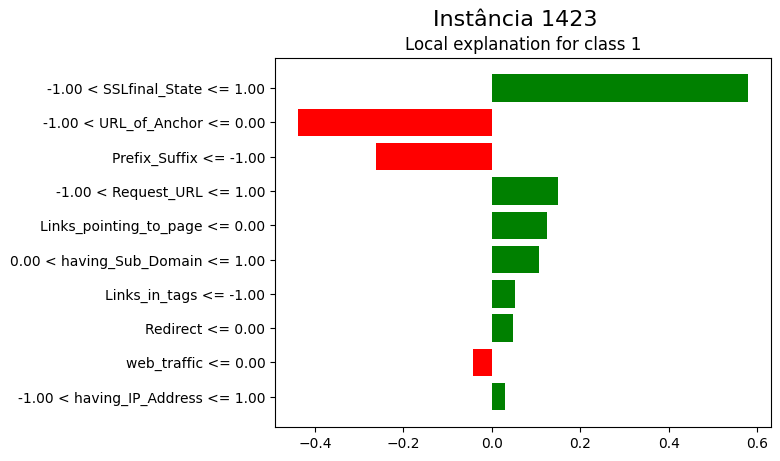

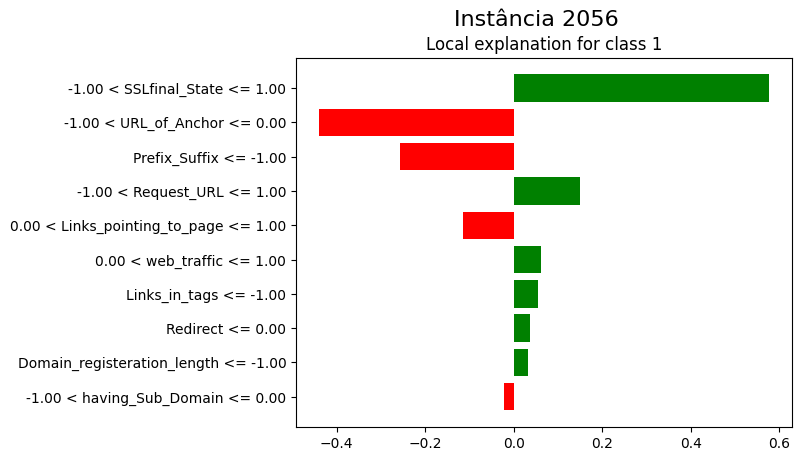

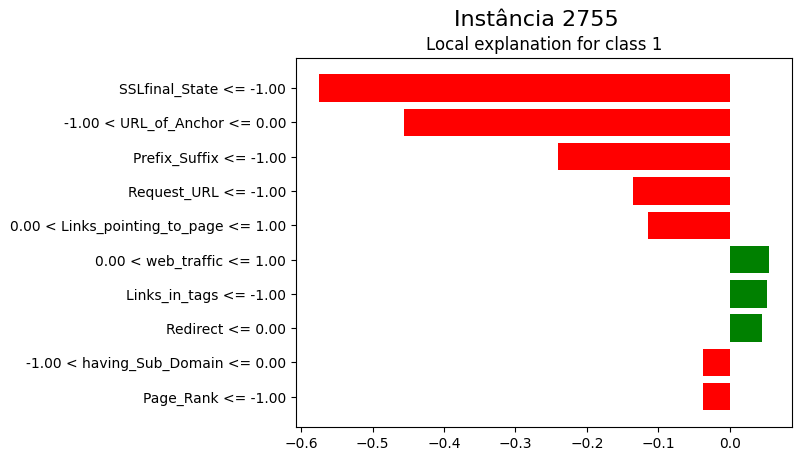

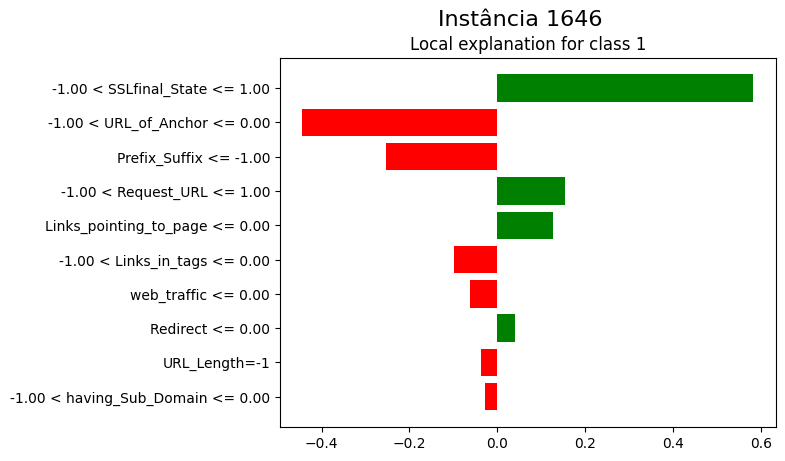

In [119]:
xai.run_local_lime()

## XGBoost

In [111]:
xgb.fit(X_train,y_train)

Pipeline(steps=[('selector',
                 SelectFromModel(estimator=LogisticRegression(C=0.99,
                                                              penalty='l1',
                                                              solver='liblinear'))),
                ('model',
                 GradientBoostingClassifier(criterion='squared_error',
                                            learning_rate=0.09, max_depth=6,
                                            n_estimators=202,
                                            subsample=0.72))])

In [112]:
xai = CompleteXAI(X_train, y_train, X_test, y_test, categorical_features, xgb[1])

PermutationExplainer explainer: 2765it [04:52,  9.07it/s]                          


Barplot para classe 1


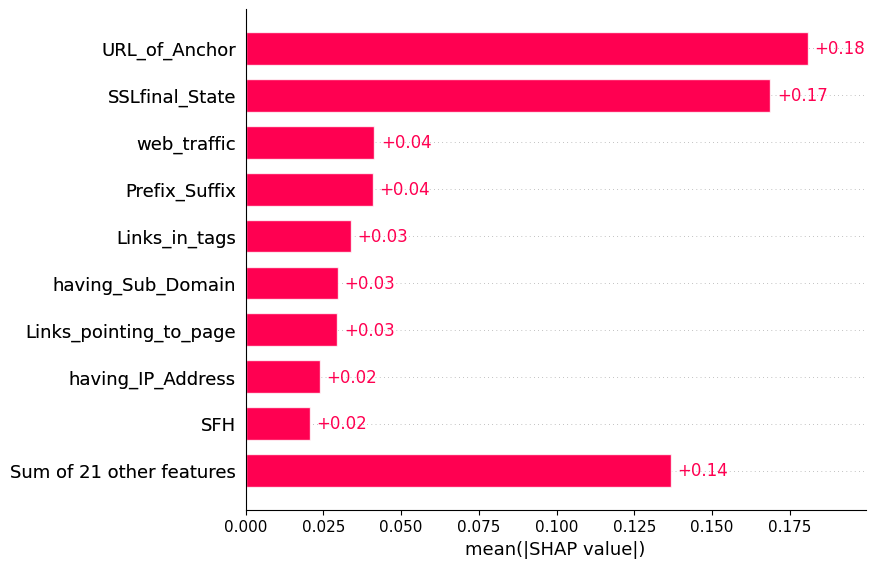

Violin plot para classe 1


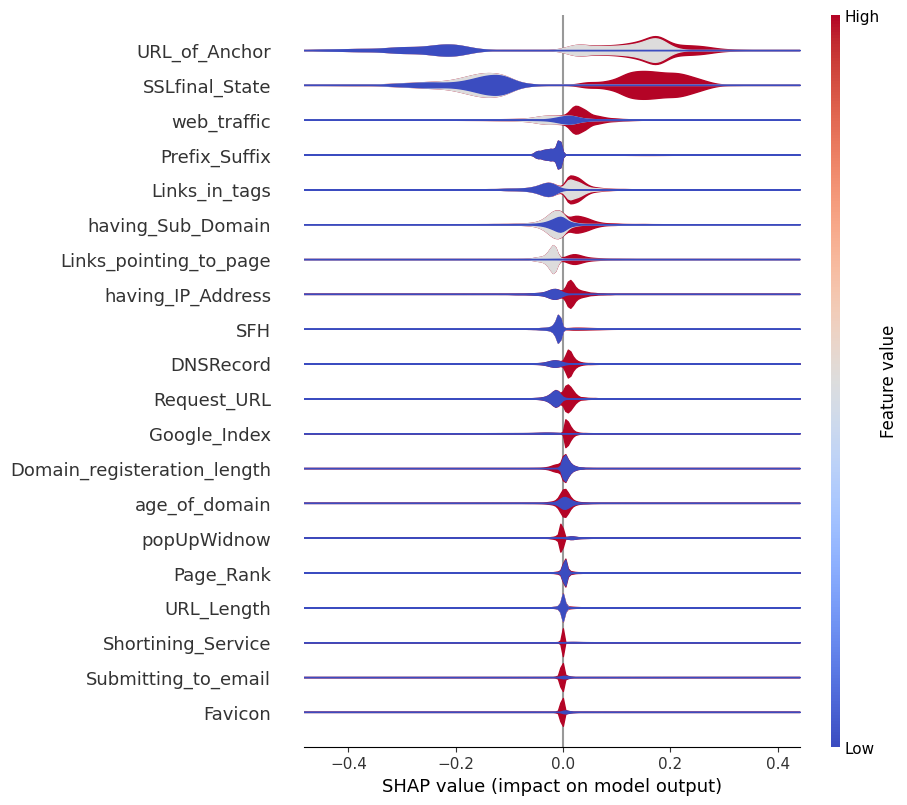

In [113]:
xai.run_global_shap()

PermutationExplainer explainer: 2765it [05:40,  7.90it/s]                          


Instância 1654

Variáveis:
 having_IP_Address              1
URL_Length                    -1
Shortining_Service             1
having_At_Symbol               1
double_slash_redirecting       1
Prefix_Suffix                 -1
having_Sub_Domain              1
SSLfinal_State                 1
Domain_registeration_length   -1
Favicon                        1
port                           1
HTTPS_token                    1
Request_URL                    1
URL_of_Anchor                  0
Links_in_tags                 -1
SFH                           -1
Submitting_to_email            1
Abnormal_URL                   1
Redirect                       0
on_mouseover                   1
RightClick                     1
popUpWidnow                    1
Iframe                         1
age_of_domain                  1
DNSRecord                      1
web_traffic                    0
Page_Rank                     -1
Google_Index                   1
Links_pointing_to_page         0
Statistical_rep

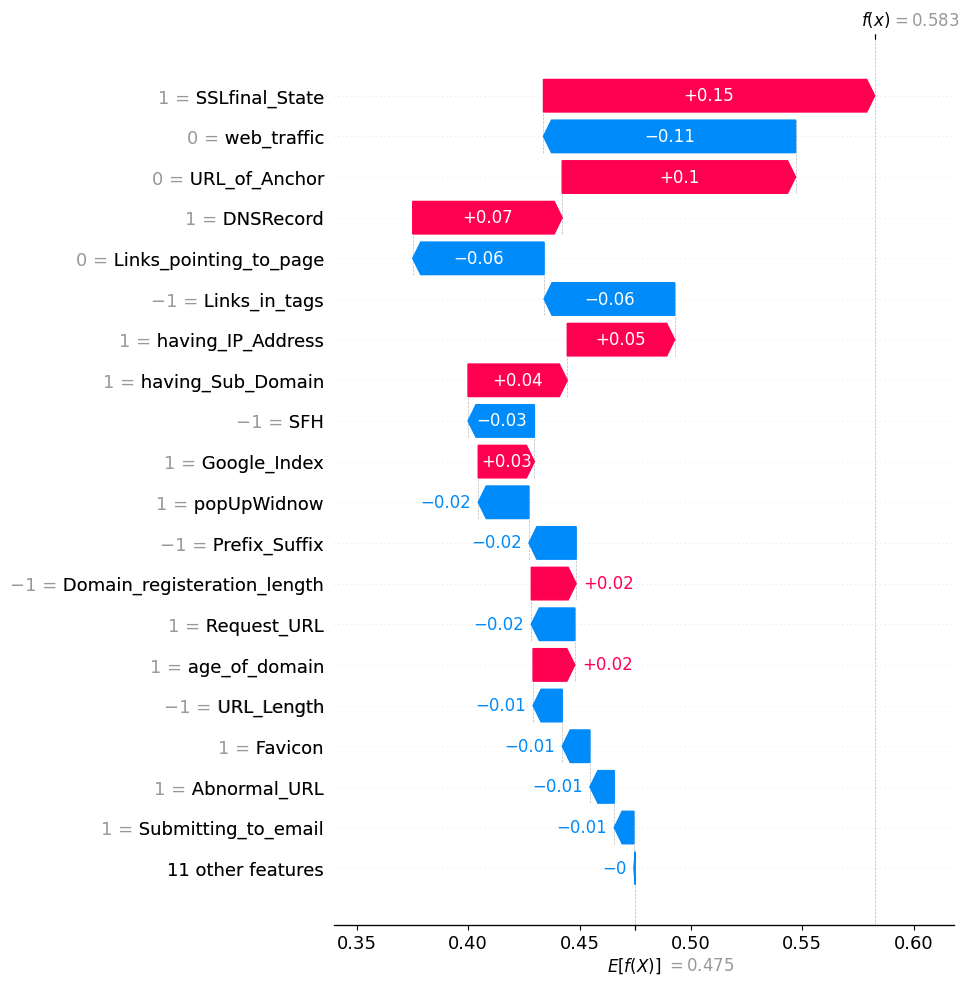

Instância 527

Variáveis:
 having_IP_Address             -1
URL_Length                    -1
Shortining_Service            -1
having_At_Symbol               1
double_slash_redirecting      -1
Prefix_Suffix                 -1
having_Sub_Domain              1
SSLfinal_State                 1
Domain_registeration_length   -1
Favicon                        1
port                           1
HTTPS_token                   -1
Request_URL                    1
URL_of_Anchor                  0
Links_in_tags                 -1
SFH                            1
Submitting_to_email            1
Abnormal_URL                  -1
Redirect                       1
on_mouseover                   1
RightClick                     1
popUpWidnow                    1
Iframe                         1
age_of_domain                  1
DNSRecord                     -1
web_traffic                    1
Page_Rank                     -1
Google_Index                   1
Links_pointing_to_page         1
Statistical_repo

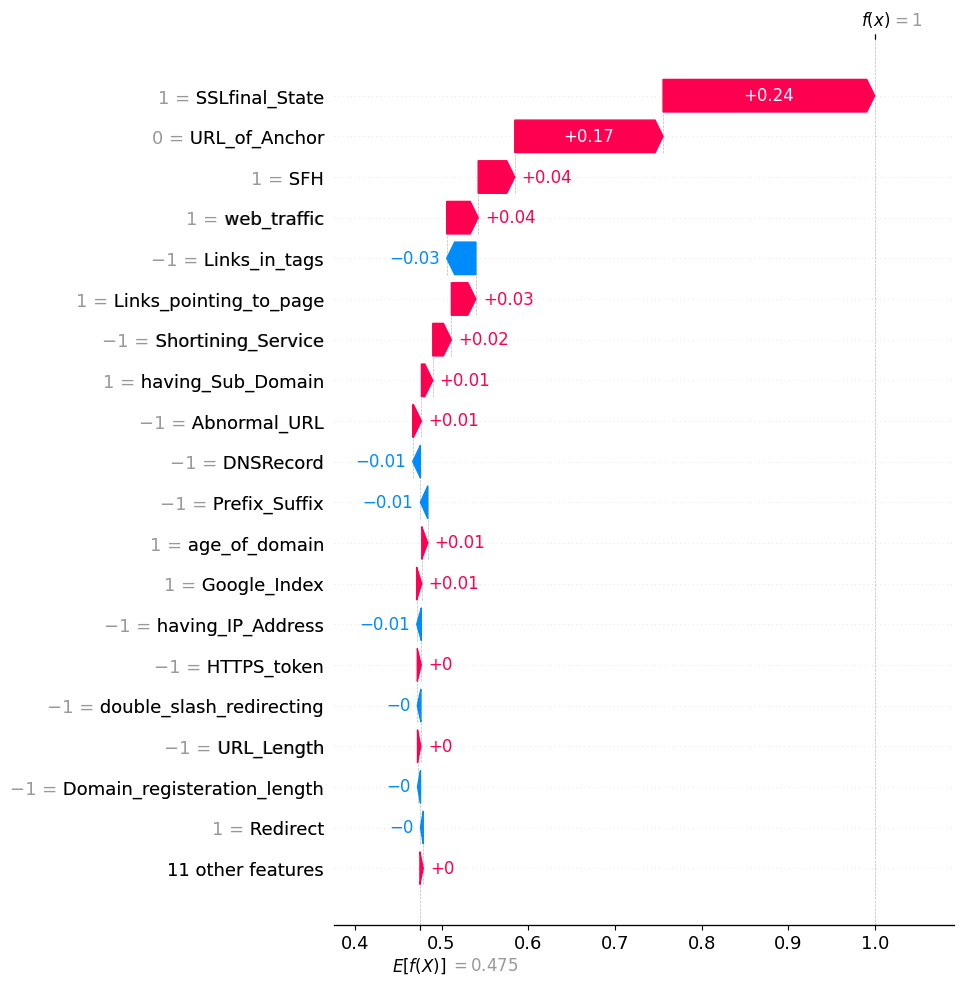

Instância 1798

Variáveis:
 having_IP_Address              1
URL_Length                    -1
Shortining_Service             1
having_At_Symbol               1
double_slash_redirecting       1
Prefix_Suffix                 -1
having_Sub_Domain             -1
SSLfinal_State                 1
Domain_registeration_length   -1
Favicon                        1
port                           1
HTTPS_token                    1
Request_URL                    1
URL_of_Anchor                  0
Links_in_tags                  0
SFH                           -1
Submitting_to_email            1
Abnormal_URL                   1
Redirect                       0
on_mouseover                   1
RightClick                     1
popUpWidnow                    1
Iframe                         1
age_of_domain                  1
DNSRecord                     -1
web_traffic                    0
Page_Rank                     -1
Google_Index                   1
Links_pointing_to_page         1
Statistical_rep

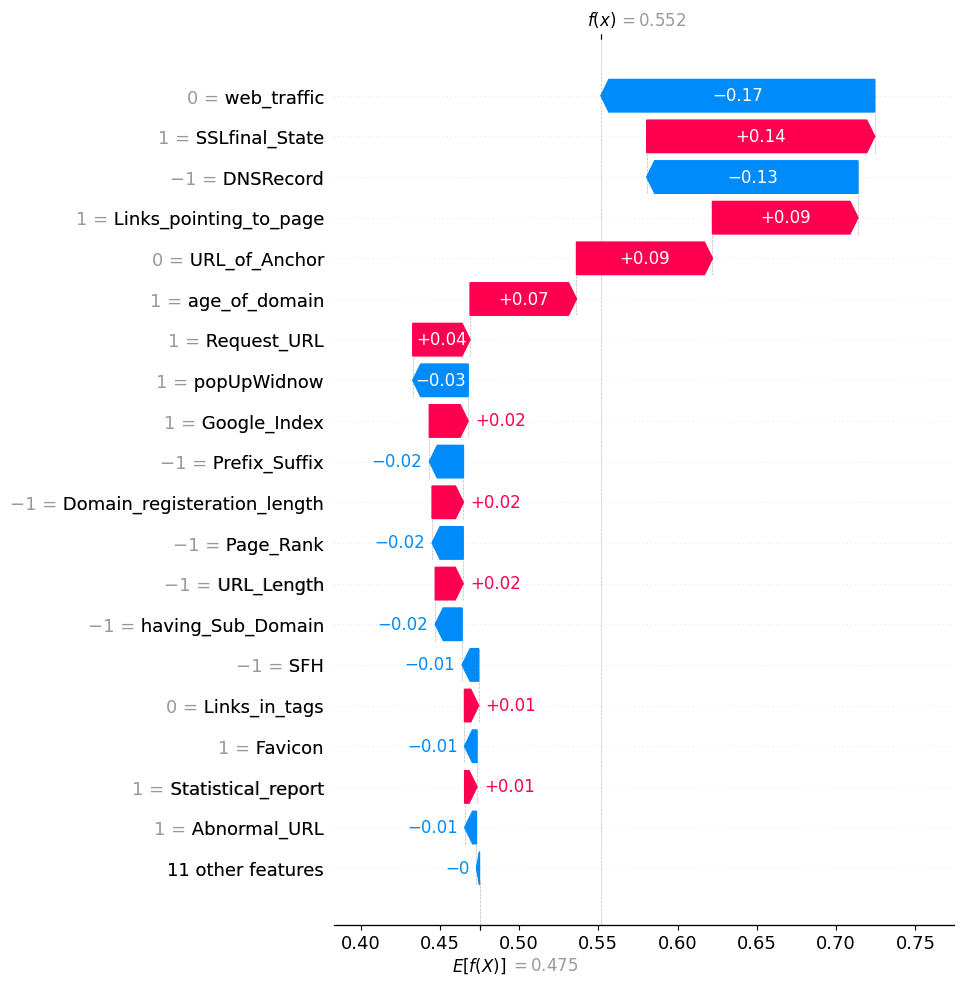

Instância 1389

Variáveis:
 having_IP_Address             -1
URL_Length                     1
Shortining_Service            -1
having_At_Symbol               1
double_slash_redirecting      -1
Prefix_Suffix                 -1
having_Sub_Domain              1
SSLfinal_State                 1
Domain_registeration_length   -1
Favicon                        1
port                           1
HTTPS_token                   -1
Request_URL                    1
URL_of_Anchor                  0
Links_in_tags                  0
SFH                           -1
Submitting_to_email            1
Abnormal_URL                  -1
Redirect                       0
on_mouseover                   1
RightClick                     1
popUpWidnow                    1
Iframe                         1
age_of_domain                  1
DNSRecord                     -1
web_traffic                    0
Page_Rank                      1
Google_Index                  -1
Links_pointing_to_page         1
Statistical_rep

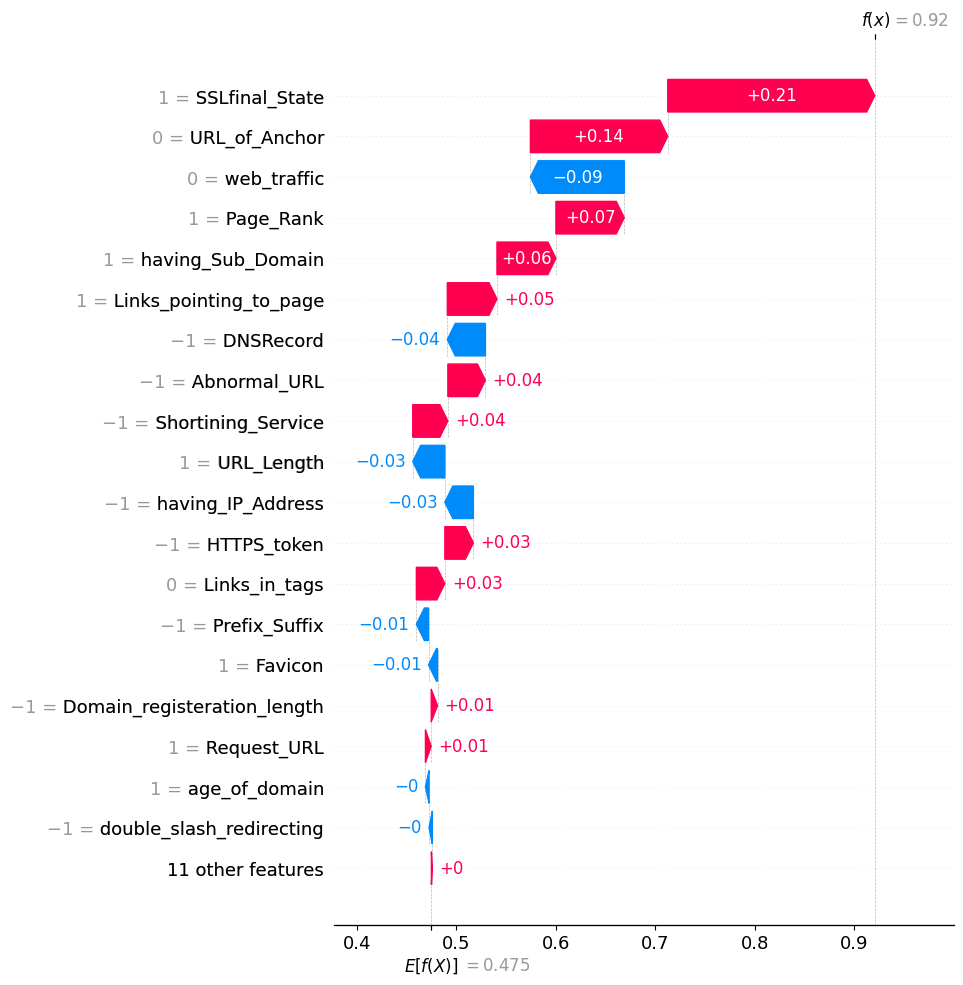

In [114]:
xai.run_local_shap()

Instância 220

Variáveis:
 having_IP_Address             -1
URL_Length                    -1
Shortining_Service             1
having_At_Symbol               1
double_slash_redirecting       1
Prefix_Suffix                 -1
having_Sub_Domain              1
SSLfinal_State                 1
Domain_registeration_length   -1
Favicon                        1
port                           1
HTTPS_token                    1
Request_URL                   -1
URL_of_Anchor                  0
Links_in_tags                 -1
SFH                           -1
Submitting_to_email            1
Abnormal_URL                   1
Redirect                       0
on_mouseover                   1
RightClick                     1
popUpWidnow                    1
Iframe                         1
age_of_domain                  1
DNSRecord                      1
web_traffic                    1
Page_Rank                     -1
Google_Index                   1
Links_pointing_to_page         0
Statistical_repo

Instância 360

Variáveis:
 having_IP_Address              1
URL_Length                    -1
Shortining_Service             1
having_At_Symbol               1
double_slash_redirecting       1
Prefix_Suffix                 -1
having_Sub_Domain              1
SSLfinal_State                 1
Domain_registeration_length   -1
Favicon                        1
port                           1
HTTPS_token                    1
Request_URL                    1
URL_of_Anchor                  0
Links_in_tags                  1
SFH                            1
Submitting_to_email            1
Abnormal_URL                   1
Redirect                       0
on_mouseover                   1
RightClick                     1
popUpWidnow                    1
Iframe                         1
age_of_domain                  1
DNSRecord                      1
web_traffic                    1
Page_Rank                     -1
Google_Index                   1
Links_pointing_to_page         0
Statistical_repo

Instância 2527

Variáveis:
 having_IP_Address             -1
URL_Length                    -1
Shortining_Service             1
having_At_Symbol               1
double_slash_redirecting       1
Prefix_Suffix                 -1
having_Sub_Domain              0
SSLfinal_State                 1
Domain_registeration_length    1
Favicon                        1
port                           1
HTTPS_token                    1
Request_URL                    1
URL_of_Anchor                  0
Links_in_tags                  0
SFH                           -1
Submitting_to_email            1
Abnormal_URL                   1
Redirect                       0
on_mouseover                   1
RightClick                     1
popUpWidnow                    1
Iframe                         1
age_of_domain                 -1
DNSRecord                      1
web_traffic                    0
Page_Rank                      1
Google_Index                   1
Links_pointing_to_page         1
Statistical_rep

Instância 9

Variáveis:
 having_IP_Address              1
URL_Length                    -1
Shortining_Service             1
having_At_Symbol               1
double_slash_redirecting       1
Prefix_Suffix                 -1
having_Sub_Domain              1
SSLfinal_State                 1
Domain_registeration_length   -1
Favicon                        1
port                           1
HTTPS_token                    1
Request_URL                    1
URL_of_Anchor                  0
Links_in_tags                  0
SFH                           -1
Submitting_to_email            1
Abnormal_URL                   1
Redirect                       0
on_mouseover                   1
RightClick                     1
popUpWidnow                    1
Iframe                         1
age_of_domain                  1
DNSRecord                      1
web_traffic                    0
Page_Rank                     -1
Google_Index                   1
Links_pointing_to_page         0
Statistical_report

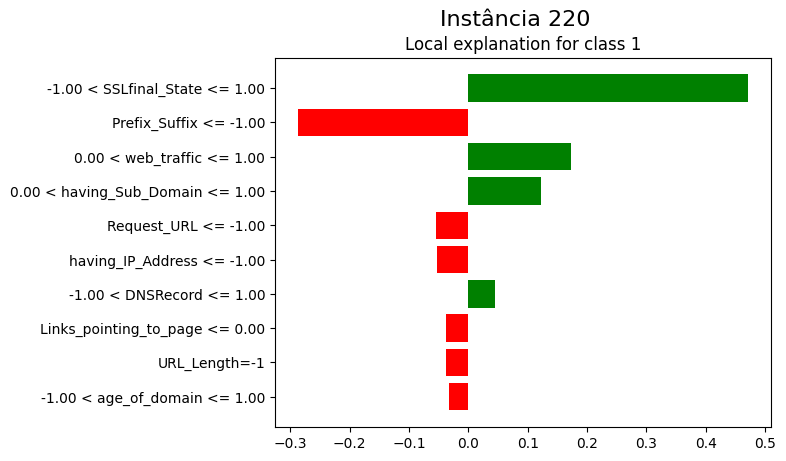

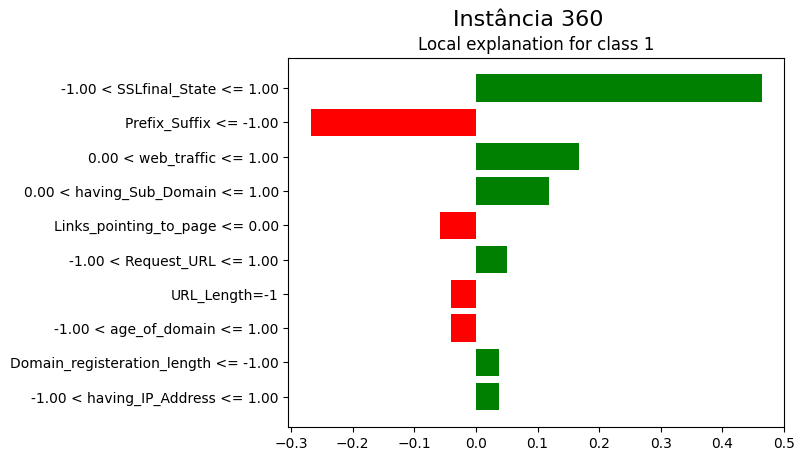

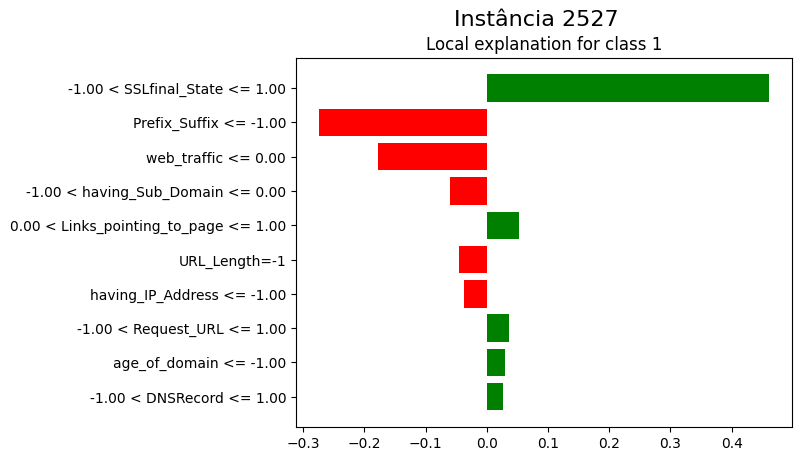

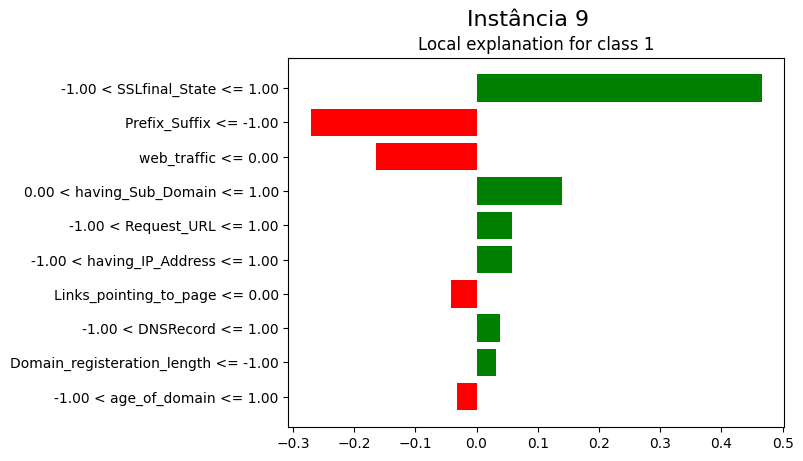

In [115]:
xai.run_local_lime()